In [45]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', 40)

In [3]:
data = pd.read_csv('wdbc.data', header=None)

In [4]:
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


### preprocessing

In [5]:
data.iloc[:, 1].unique()

array(['M', 'B'], dtype=object)

In [6]:
def f(x):
    if x == 'M':
        return 1
    else:
        return 0
data[1] = list(map(f, data[1]))

In [7]:
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [16]:
data.shape

(569, 32)

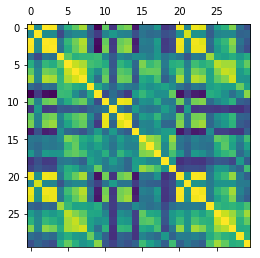

In [39]:
plt.figure(figsize=(20, 20))
plt.matshow(data.iloc[:, 2:].corr())
plt.show()

In [41]:
import seaborn as sns

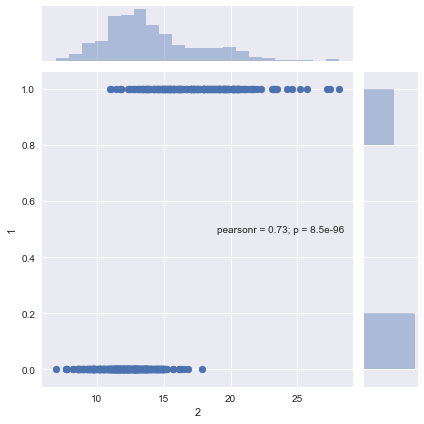

In [46]:
sns.jointplot(x=data.iloc[:, 2], y=data.iloc[:, 1]);

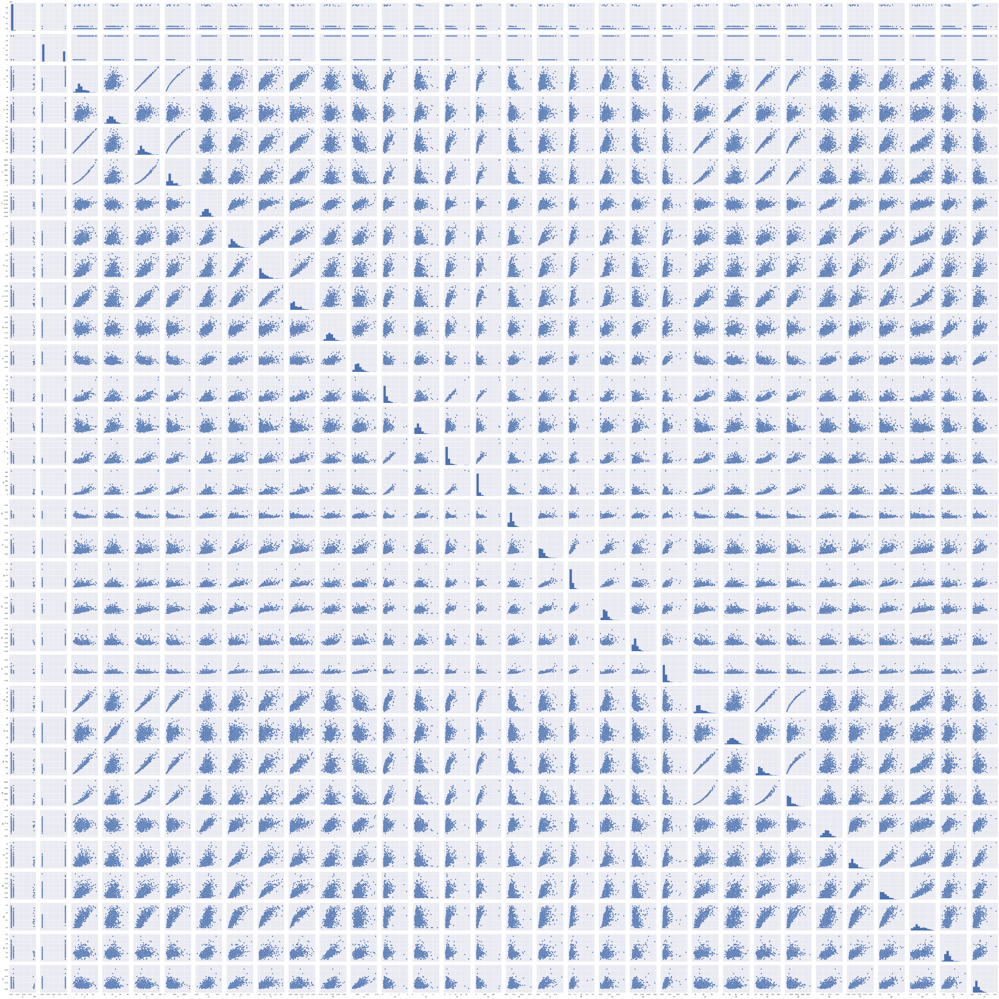

In [47]:
sns.pairplot(data)

### Build the model

In [8]:
X = data.iloc[:, 2:]
Y = data.iloc[:, 1]

In [9]:
from sklearn import preprocessing

In [10]:
X_normalized = preprocessing.normalize(X, norm='l2')

In [11]:
from sklearn.model_selection import train_test_split

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X_normalized, Y, test_size=0.2, random_state=42)

In [13]:
from sklearn.svm import SVC

In [17]:
from sklearn.metrics import confusion_matrix

In [20]:
models = dict()

iters = range(10, 200, 10)
kernels = ['rbf', 'sigmoid', "poly", "linear"]

for kernel in kernels:
    models[kernel] = {}
    for iteration in iters:
        model = SVC(kernel=kernel, max_iter=iteration)
        model.fit(X=X_train, y=y_train)
        models[kernel][iteration] = model

/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=20).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=30).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=40).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anacond

In [21]:
models

{'linear': {10: SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
    max_iter=10, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False),
  20: SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
    max_iter=20, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False),
  30: SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
    max_iter=30, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False),
  40: SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
    max_iter=40, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False),
  50: SVC(C=1.0, cache_siz

In [58]:
from sklearn.metrics import accuracy_score

In [23]:
for kernel in kernels:
    print("kernel:", kernel)
    print()
    for iteration in iters:
        model = models[kernel][iteration]
        train_y_pred = model.predict(X_train)
        conf_train = confusion_matrix(y_train, train_y_pred).ravel()
        test_y_pred = model.predict(X_test)
        conf_test = confusion_matrix(y_test, test_y_pred).ravel()
        print("iteration:", iteration, ", train confusion matrix:",\
              conf_train, ", test confusion matrix:", conf_test)
        print()
    print('-------------------------------------------------------')

kernel: rbf

iteration: 10 , train confusion matrix: [ 83 203  27 142] , test confusion matrix: [21 50  4 39]

iteration: 20 , train confusion matrix: [212  74   9 160] , test confusion matrix: [56 15  0 43]

iteration: 30 , train confusion matrix: [169 117   4 165] , test confusion matrix: [46 25  0 43]

iteration: 40 , train confusion matrix: [145 141   2 167] , test confusion matrix: [41 30  0 43]

iteration: 50 , train confusion matrix: [140 146   4 165] , test confusion matrix: [38 33  0 43]

iteration: 60 , train confusion matrix: [201  85   6 163] , test confusion matrix: [55 16  0 43]

iteration: 70 , train confusion matrix: [158 128   1 168] , test confusion matrix: [40 31  0 43]

iteration: 80 , train confusion matrix: [150 136   1 168] , test confusion matrix: [38 33  0 43]

iteration: 90 , train confusion matrix: [135 151   1 168] , test confusion matrix: [38 33  0 43]

iteration: 100 , train confusion matrix: [118 168   1 168] , test confusion matrix: [29 42  0 43]

iterat

In [65]:
arrays_train = []
arrays_test = []
for kernel in kernels:
    arr_train = []
    arr_test = []
    for iteration in iters:
        model = models[kernel][iteration]
        train_y_pred = model.predict(X_train)
        score_train = accuracy_score(y_train, train_y_pred)
        test_y_pred = model.predict(X_test)
        score_test = accuracy_score(y_test, test_y_pred)
        arr_train.append(score_train)
        arr_test.append(score_test)
    arrays_train.append(arr_train)
    arrays_test.append(arr_test)

In [69]:
len(iters), len(kernels)

(19, 4)

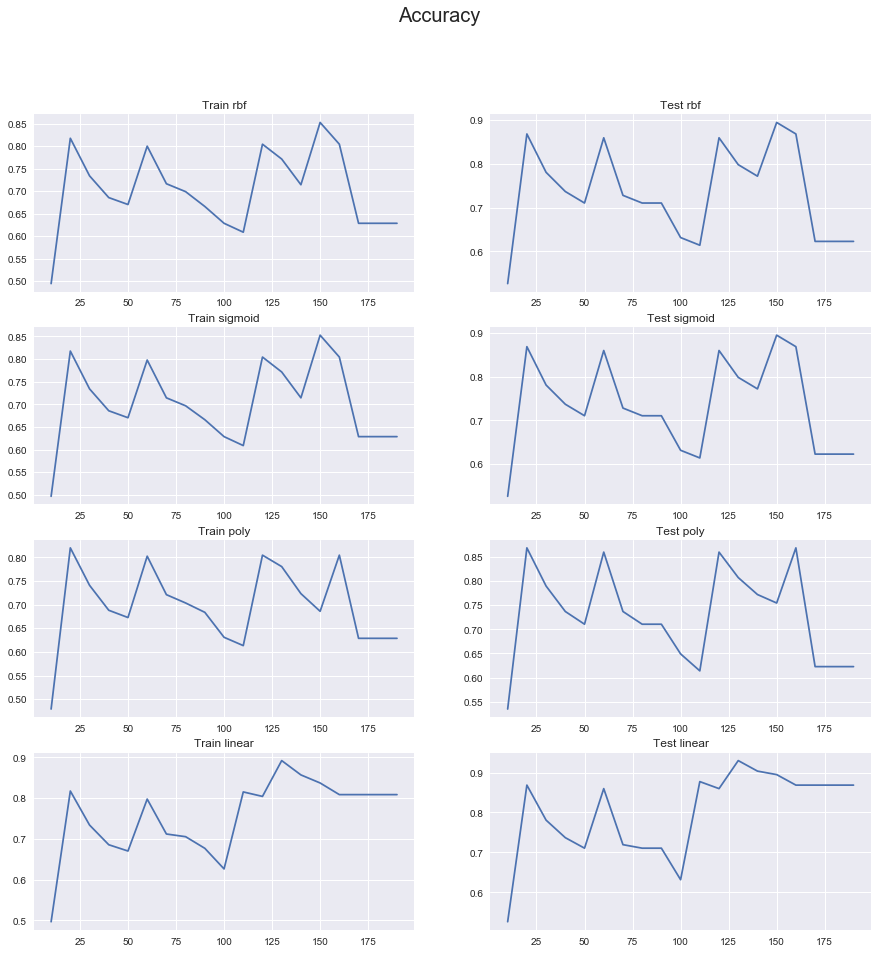

In [84]:
f, axarr = plt.subplots(4, 2, figsize=(15,15))
f.suptitle('Accuracy', fontsize=20)
for i in range(len(kernels)):
    axarr[i, 0].plot(iters, arrays_train[i])
    axarr[i, 0].set_title('Train ' + kernels[i])
    axarr[i, 1].plot(iters, arrays_test[i])
    axarr[i, 1].set_title('Test ' + kernels[i])

### The best model is with the linear kernel at the 130th iteration, but they have a similar pattern with dfferent values

### There is a similar correlation between some variables and the target column, we can use pca before svm

In [48]:
from sklearn.decomposition import PCA

In [50]:
pca = PCA(n_components=10)

In [54]:
X_train_new = pca.fit_transform(X_train)

In [55]:
X_test_new = pca.transform(X_test)

In [56]:
models2 = dict()

iters = range(10, 200, 10)
kernels = ['rbf', 'sigmoid', "poly", "linear"]

for kernel in kernels:
    models2[kernel] = {}
    for iteration in iters:
        model = SVC(kernel=kernel, max_iter=iteration)
        model.fit(X=X_train_new, y=y_train)
        models2[kernel][iteration] = model

/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=20).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=30).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anaconda/lib/python3.5/site-packages/sklearn/svm/base.py:218: ConvergenceWarning: Solver terminated early (max_iter=40).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/Users/apple/anacond

In [57]:
for kernel in kernels:
    print("kernel:", kernel)
    print()
    for iteration in iters:
        model = models2[kernel][iteration]
        train_y_pred = model.predict(X_train_new)
        conf_train = confusion_matrix(y_train, train_y_pred).ravel()
        test_y_pred = model.predict(X_test_new)
        conf_test = confusion_matrix(y_test, test_y_pred).ravel()
        print("iteration:", iteration, ", train confusion matrix:",\
              conf_train, ", test confusion matrix:", conf_test)
        print()
    print('-------------------------------------------------------')

kernel: rbf

iteration: 10 , train confusion matrix: [ 83 203  26 143] , test confusion matrix: [21 50  4 39]

iteration: 20 , train confusion matrix: [212  74   9 160] , test confusion matrix: [56 15  0 43]

iteration: 30 , train confusion matrix: [169 117   4 165] , test confusion matrix: [46 25  0 43]

iteration: 40 , train confusion matrix: [145 141   2 167] , test confusion matrix: [41 30  0 43]

iteration: 50 , train confusion matrix: [140 146   4 165] , test confusion matrix: [38 33  0 43]

iteration: 60 , train confusion matrix: [201  85   6 163] , test confusion matrix: [55 16  0 43]

iteration: 70 , train confusion matrix: [158 128   1 168] , test confusion matrix: [40 31  0 43]

iteration: 80 , train confusion matrix: [150 136   1 168] , test confusion matrix: [38 33  0 43]

iteration: 90 , train confusion matrix: [137 149   1 168] , test confusion matrix: [38 33  0 43]

iteration: 100 , train confusion matrix: [118 168   1 168] , test confusion matrix: [30 41  0 43]

iterat

In [85]:
arrays2_train = []
arrays2_test = []
for kernel in kernels:
    arr_train = []
    arr_test = []
    for iteration in iters:
        model = models2[kernel][iteration]
        train_y_pred = model.predict(X_train_new)
        score_train = accuracy_score(y_train, train_y_pred)
        test_y_pred = model.predict(X_test_new)
        score_test = accuracy_score(y_test, test_y_pred)
        arr_train.append(score_train)
        arr_test.append(score_test)
    arrays2_train.append(arr_train)
    arrays2_test.append(arr_test)

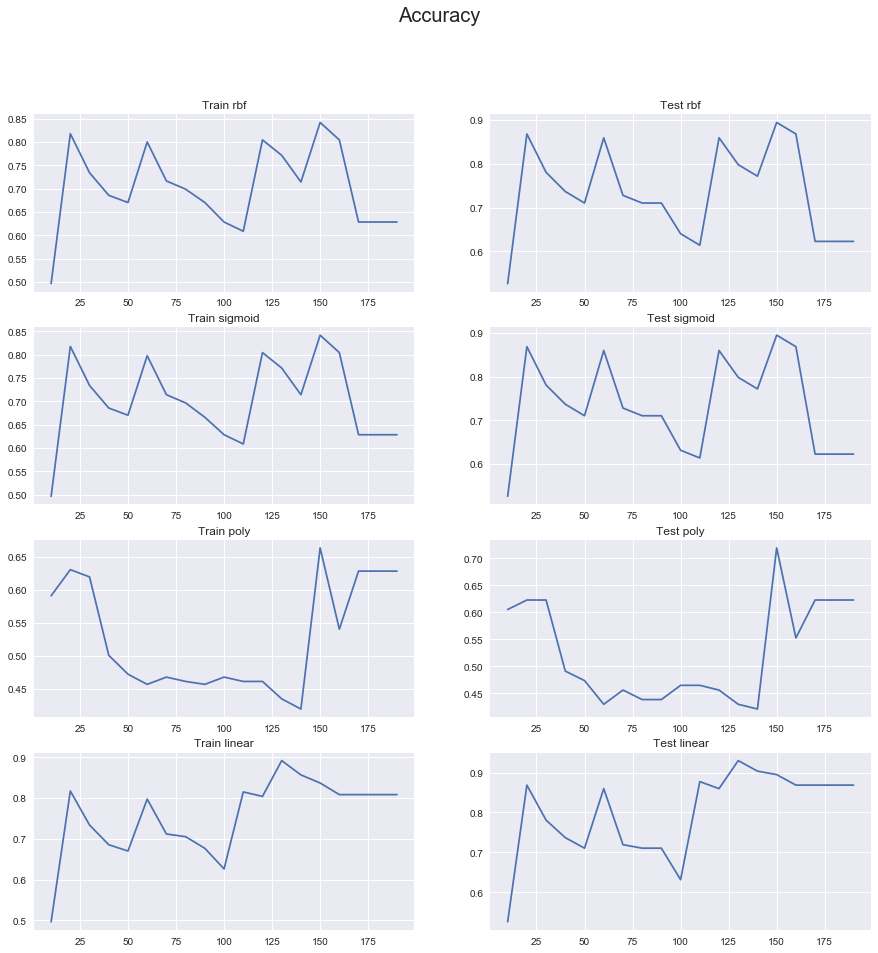

In [86]:
f, axarr = plt.subplots(4, 2, figsize=(15,15))
f.suptitle('Accuracy', fontsize=20)
for i in range(len(kernels)):
    axarr[i, 0].plot(iters, arrays2_train[i])
    axarr[i, 0].set_title('Train ' + kernels[i])
    axarr[i, 1].plot(iters, arrays2_test[i])
    axarr[i, 1].set_title('Test ' + kernels[i])

### Same as before, linear kernel is the best.